In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns

In [3]:
from google.colab import files
files.upload()

Saving diabetes_dataset.csv to diabetes_dataset.csv


{'diabetes_dataset.csv': b'age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes\r\n58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,7.9,7.9,0,0,0,30.5,0.89,134,78,68,239,41,160,145,136,236,6.36,8.18,29.6,Type 2,1\r\n48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,6.5,8.7,0,0,0,23.1,0.8,129,76,67,116,55,50,30,93,150,2.0,5.63,23.0,No Diabetes,0\r\n60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,10.0,8.1,1,0,0,22.2,0.81,115,73,74,213,66,99,36,118,195,5.07,7.51,44.7,Type 2,1\r\n74,Female,Black,Highschool,Lo

In [4]:
df = data = pd.read_csv('diabetes_dataset.csv')
df

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,...,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,...,41,160,145,136,236,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,...,55,50,30,93,150,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,...,66,99,36,118,195,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,0,49,3.4,...,50,79,140,139,253,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,1,109,7.2,...,52,125,160,137,184,12.74,7.20,23.5,Type 2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,46,Male,Other,Graduate,Upper-Middle,Unemployed,Former,1,136,8.3,...,45,150,116,113,109,14.58,5.55,26.0,Pre-Diabetes,0
99996,41,Female,White,Graduate,Middle,Employed,Never,3,76,8.8,...,55,123,146,96,146,9.02,5.97,24.4,Pre-Diabetes,0
99997,57,Female,Black,No formal,Upper-Middle,Employed,Former,4,121,9.9,...,50,111,184,93,132,2.57,5.21,27.6,No Diabetes,0
99998,47,Female,Black,Highschool,Lower-Middle,Retired,Never,3,52,5.9,...,68,91,116,106,117,9.81,5.53,26.4,Pre-Diabetes,0


**LÀM SẠCH DỮ LIỆU**

In [5]:
df.drop(['alcohol_consumption_per_week', 'glucose_fasting', 'glucose_postprandial'], axis=1, inplace=True)
df

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,215,5.7,7.9,...,68,239,41,160,145,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,143,6.7,6.5,...,67,116,55,50,30,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,57,6.4,10.0,...,74,213,66,99,36,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,49,3.4,6.6,...,68,171,50,79,140,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,109,7.2,7.4,...,67,210,52,125,160,12.74,7.20,23.5,Type 2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,46,Male,Other,Graduate,Upper-Middle,Unemployed,Former,136,8.3,6.4,...,63,227,45,150,116,14.58,5.55,26.0,Pre-Diabetes,0
99996,41,Female,White,Graduate,Middle,Employed,Never,76,8.8,6.8,...,57,207,55,123,146,9.02,5.97,24.4,Pre-Diabetes,0
99997,57,Female,Black,No formal,Upper-Middle,Employed,Former,121,9.9,5.0,...,69,189,50,111,184,2.57,5.21,27.6,No Diabetes,0
99998,47,Female,Black,Highschool,Lower-Middle,Retired,Never,52,5.9,6.7,...,58,173,68,91,116,9.81,5.53,26.4,Pre-Diabetes,0


In [6]:
df = df.head(400)
df

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,215,5.7,7.9,...,68,239,41,160,145,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,143,6.7,6.5,...,67,116,55,50,30,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,57,6.4,10.0,...,74,213,66,99,36,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,49,3.4,6.6,...,68,171,50,79,140,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,109,7.2,7.4,...,67,210,52,125,160,12.74,7.20,23.5,Type 2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,42,Male,White,Highschool,Middle,Unemployed,Current,93,8.3,6.9,...,67,183,33,114,114,4.84,5.42,43.5,Pre-Diabetes,0
396,23,Male,White,Graduate,Upper-Middle,Employed,Never,96,2.4,8.7,...,58,158,47,93,107,2.00,7.31,22.8,Type 2,1
397,72,Male,Black,Graduate,Low,Employed,Current,32,6.2,7.2,...,74,239,43,174,87,10.58,7.89,37.3,Type 2,1
398,48,Female,Other,Postgraduate,Middle,Employed,Former,285,5.0,8.4,...,68,234,37,150,64,15.97,7.95,18.7,Type 2,1


In [7]:
df.dtypes

,0
age,int64
gender,object
ethnicity,object
education_level,object
income_level,object
employment_status,object
smoking_status,object
physical_activity_minutes_per_week,int64
diet_score,float64
sleep_hours_per_day,float64


In [8]:
df.isnull().sum()

,0
age,0
gender,0
ethnicity,0
education_level,0
income_level,0
employment_status,0
smoking_status,0
physical_activity_minutes_per_week,0
diet_score,0
sleep_hours_per_day,0


In [9]:
df['diagnosed_diabetes'] = df['diagnosed_diabetes'].astype(str)

/tmp/ipykernel_1427/2138343828.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diagnosed_diabetes'] = df['diagnosed_diabetes'].astype(str)


# **2. Trực quan hóa dữ liệu**

**CÂU HỎI ĐẶT RA**


1.   CÂU HỎI ĐỊNH LƯỢNG

*   Điểm số rủi ro tiểu đường (diabetes_risk_score) có tăng theo tuổi tác (age) không?
*   Thời gian vận động thể chất (physical_activity_minutes) có ảnh hưởng đến chỉ số Insulin (insulin_level) không?
*   Chỉ số Cholesterol tốt (hdl_cholesterol) và Cholesterol xấu (ldl_cholesterol) có mối tương quan với nhau không?
*   Chỉ số đường huyết trung bình (hba1c) có sự khác biệt như thế nào giữa các nhóm tiền sử gia đình mắc bệnh tiểu đường (family_history_diabetes)?





2.   CÂU HỎI ĐỊNH TÍNH


*   Chủng tộc (ethnicity) có ảnh hưởng đến điểm số rủi ro tiểu đường (diabetes_risk_score) không?
*   Giới tính (gender) có ảnh hưởng đến điểm số rủi ro tiểu đường (diabetes_risk_score) không?
*   Trình độ học vấn (education_level) có ảnh hưởng đến điểm số chế độ ăn uống lành mạnh (diet_score) không?
*   Mức thu nhập (income_level) có liên quan đến thời gian vận động thể chất (physical_activity_minutes) không?
*   Tình trạng việc làm (employment_status) có ảnh hưởng đến mức độ rủi ro tiểu đường (diabetes_risk_score) không?









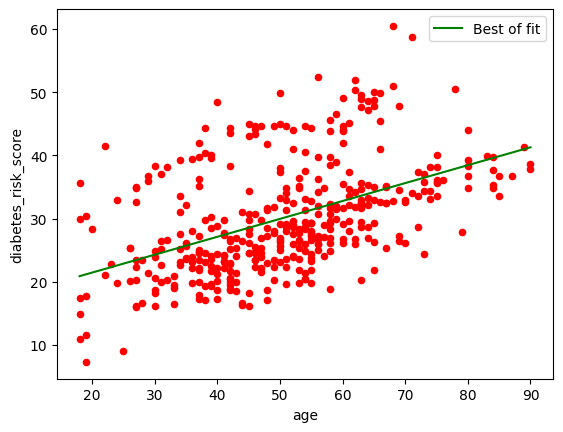

In [10]:
# Điểm số rủi ro tiểu đường (diabetes_risk_score) có tăng theo tuổi tác (age) không?
model = LinearRegression()
x = df[['age']]
y = df['diabetes_risk_score']
model.fit(x, y)
model.coef_
model.intercept_
df.plot.scatter(
    x="age",
    y="diabetes_risk_score",
    color="red"
)

x_line = np.linspace(x.min(), x.max(), 100).reshape(-1,1)
y_line = model.coef_[0] * x_line + model.intercept_

plt.plot(x_line, y_line, color='green', label='Best of fit')
plt.legend()
plt.show()

/tmp/ipykernel_1427/1366398508.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Activity_Group'] = df['physical_activity_minutes_per_week'].apply(get_activity_group)


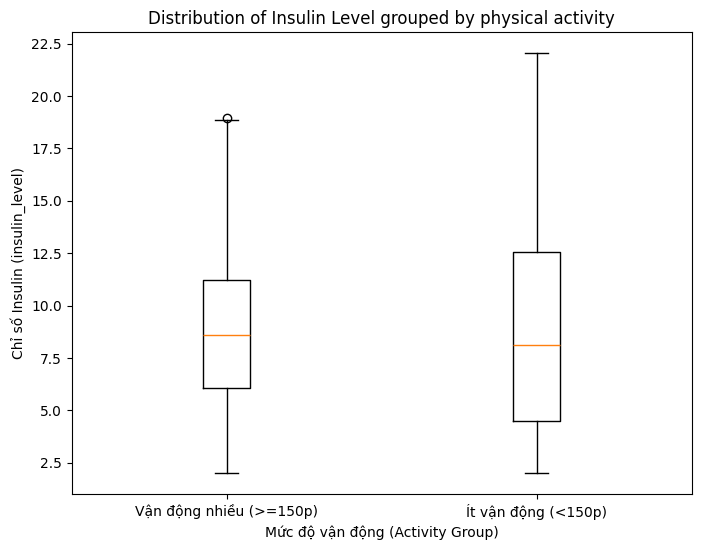

In [11]:
# Thời gian vận động thể chất (physical_activity_minutes) có ảnh hưởng đến chỉ số Insulin (insulin_level) không?
import matplotlib.pyplot as plt
def get_activity_group(minutes):
    if minutes < 150:
        return "Ít vận động (<150p)"
    else:
        return "Vận động nhiều (>=150p)"
df['Activity_Group'] = df['physical_activity_minutes_per_week'].apply(get_activity_group)

grouped = df.groupby('Activity_Group')['insulin_level'].apply(list)

plt.figure(figsize=(8, 6))
plt.boxplot(grouped, tick_labels=grouped.index)

plt.xlabel('Mức độ vận động (Activity Group)')
plt.ylabel('Chỉ số Insulin (insulin_level)')
plt.title('Distribution of Insulin Level grouped by physical activity')

plt.show()

/tmp/ipykernel_1427/2256686876.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Family_History_Label'] = df['family_history_diabetes'].map({0: 'Không có tiền sử', 1: 'Có tiền sử gia đình'})


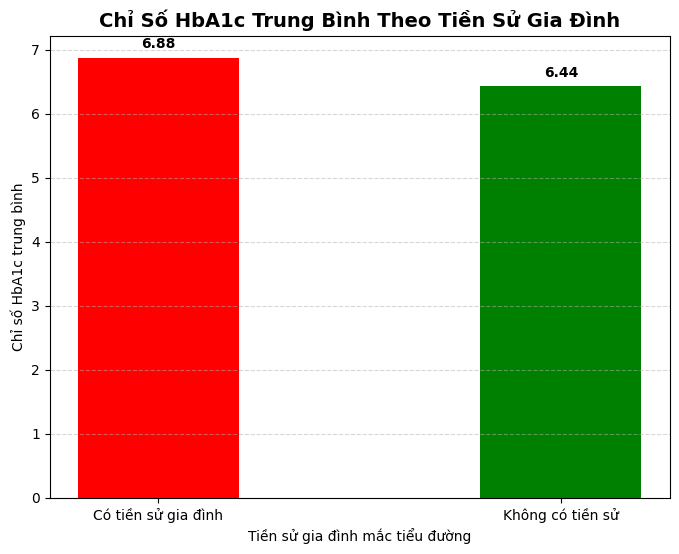

In [12]:
# Chỉ số đường huyết trung bình (hba1c) có sự khác biệt như thế nào giữa các nhóm tiền sử gia đình mắc bệnh tiểu đường (family_history_diabetes)?
df['Family_History_Label'] = df['family_history_diabetes'].map({0: 'Không có tiền sử', 1: 'Có tiền sử gia đình'})

grouped_means = df.groupby('Family_History_Label')['hba1c'].mean()

plt.figure(figsize=(8, 6))
colors = ['red', 'green']
plt.bar(grouped_means.index, grouped_means.values, color=colors, width=0.4)

plt.title('Chỉ Số HbA1c Trung Bình Theo Tiền Sử Gia Đình', fontsize=14, fontweight='bold')
plt.xlabel('Tiền sử gia đình mắc tiểu đường')
plt.ylabel('Chỉ số HbA1c trung bình')
plt.grid(axis='y', linestyle='--', alpha=0.5)

for i, val in enumerate(grouped_means.values):
    plt.text(i, val + 0.1, f'{val:.2f}', ha='center', va='bottom', fontweight='bold')

plt.show()

Text(0, 0.5, 'Cholesterol xấu (ldl_cholesterol)')

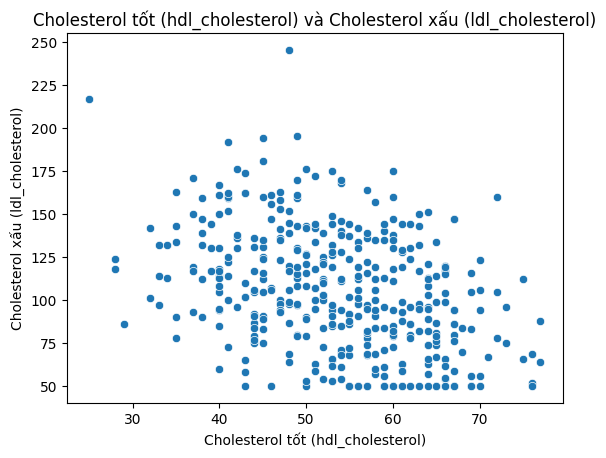

In [13]:
# Chỉ số Cholesterol tốt (hdl_cholesterol) và Cholesterol xấu (ldl_cholesterol) có mối tương quan với nhau không?
sns.scatterplot(data=df, x='hdl_cholesterol', y='ldl_cholesterol')
plt.title('Cholesterol tốt (hdl_cholesterol) và Cholesterol xấu (ldl_cholesterol)')
plt.xlabel('Cholesterol tốt (hdl_cholesterol)')
plt.ylabel('Cholesterol xấu (ldl_cholesterol)')

/tmp/ipykernel_1427/2080878889.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age_Group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels, include_lowest=True)
/tmp/ipykernel_1427/2080878889.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Risk_Group'] = pd.cut(df['diabetes_risk_score'], bins=risk_bins, labels=risk_labels)


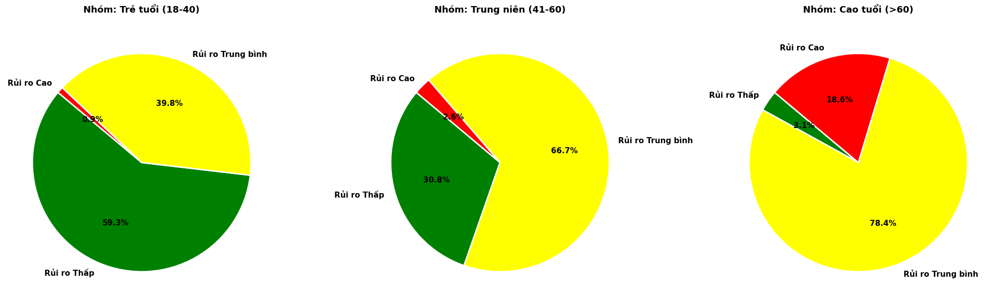

In [14]:
# Khi tuổi (age) tăng thì tỉ lệ rủi ro tiểu đường (diabetes_risk_score) không?
age_bins = [0, 40, 60, 100]
age_labels = ['Trẻ tuổi (18-40)', 'Trung niên (41-60)', 'Cao tuổi (>60)']
df['Age_Group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels, include_lowest=True)

risk_bins = [df['diabetes_risk_score'].min() - 1, 25, 45, df['diabetes_risk_score'].max() + 1]
risk_labels = ['Rủi ro Thấp', 'Rủi ro Trung bình', 'Rủi ro Cao']
df['Risk_Group'] = pd.cut(df['diabetes_risk_score'], bins=risk_bins, labels=risk_labels)
crosstab_data = pd.crosstab(df['Age_Group'], df['Risk_Group'])

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

colors = ['green', 'yellow', 'red']

for i, age_grp in enumerate(age_labels):
    data_pie = crosstab_data.loc[age_grp]

    axes[i].pie(data_pie,
                labels=data_pie.index,
                autopct='%1.1f%%',
                startangle=140,
                colors=colors,
                textprops={'fontsize': 11, 'fontweight': 'bold'},
                wedgeprops={'edgecolor': 'white', 'linewidth': 2})

    axes[i].set_title(f'Nhóm: {age_grp}', fontsize=13, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()
# có

Text(0, 0.5, 'Điểm số rủi ro tiểu đường (diabetes_risk_score)')

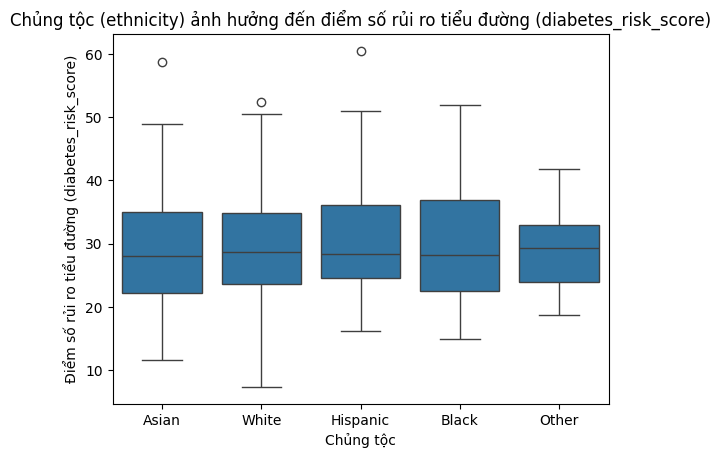

In [15]:
# Chủng tộc (ethnicity) có ảnh hưởng đến điểm số rủi ro tiểu đường (diabetes_risk_score) không?
sns.boxplot(data=df, x='ethnicity', y='diabetes_risk_score')
plt.title('Chủng tộc (ethnicity) ảnh hưởng đến điểm số rủi ro tiểu đường (diabetes_risk_score)')
plt.xlabel('Chủng tộc')
plt.ylabel('Điểm số rủi ro tiểu đường (diabetes_risk_score)')
#

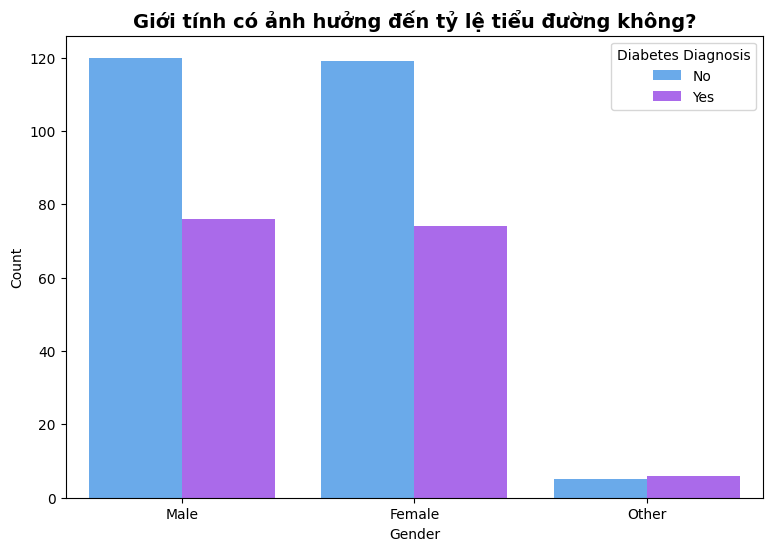

In [16]:
# Giới tính (gender) có ảnh hưởng đến điểm số rủi ro tiểu đường (diabetes_risk_score) không?
plt.figure(figsize=(9, 6))
sns.countplot( data=df, x="gender", hue="diagnosed_diabetes", palette="cool" )

plt.title("Giới tính có ảnh hưởng đến tỷ lệ tiểu đường không?", fontsize=14, fontweight='bold')
plt.xlabel("Gender")
plt.ylabel("Count")

plt.legend(title="Diabetes Diagnosis", labels=["No", "Yes"])

plt.show()

/tmp/ipykernel_1427/2528320867.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diet_score_group'] = pd.cut(df['diet_score'], bins=bins, labels=labels, include_lowest=True)


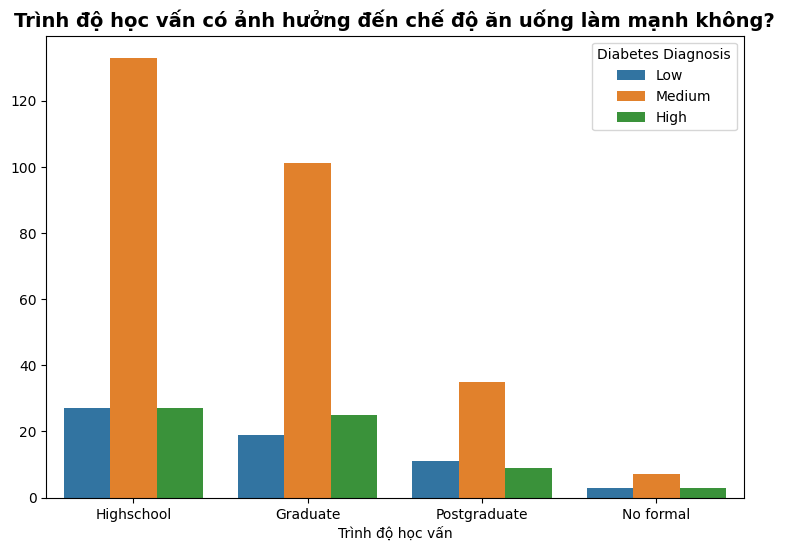

In [17]:
# Trình độ học vấn (education_level) có ảnh hưởng đến điểm số chế độ ăn uống lành mạnh (diet_score) không?
bins = [0, 4, 8, 10]
labels = ['Low', 'Medium', 'High']

df['diet_score_group'] = pd.cut(df['diet_score'], bins=bins, labels=labels, include_lowest=True)
plt.figure(figsize=(9, 6))
sns.countplot( data=df, x="education_level", hue="diet_score_group" )

plt.title("Trình độ học vấn có ảnh hưởng đến chế độ ăn uống làm mạnh không?", fontsize=14, fontweight='bold')
plt.xlabel("Trình độ học vấn")
plt.ylabel("")

plt.legend(title="Diabetes Diagnosis", labels=["Low", "Medium", "High"])

plt.show()
# đa số mọi người có chế độ ăn uống bình thường
# số người ăn uống lành mạnh sau tốt nghiệp cao hơn số người không ăn uống lành mạnh, những người chưa tốt nghiệp ngược lại

### **Nhận xét về Trình độ học vấn và Chế độ ăn uống:**
- **Xu hướng chung:** Đa số các nhóm học vấn đều có chế độ ăn uống ở mức 'Medium'.
- **Sự khác biệt:** Nhóm đã tốt nghiệp (Graduate) có tỷ lệ người duy trì chế độ ăn uống lành mạnh ('High') cao hơn đáng kể so với nhóm chưa tốt nghiệp. Ngược lại, những người có trình độ học vấn thấp hơn thường có tỷ lệ 'Low' diet score cao hơn, cho thấy trình độ học vấn có thể ảnh hưởng đến nhận thức về dinh dưỡng.

Text(0, 0.5, 'Thời gian vận động thể chất')

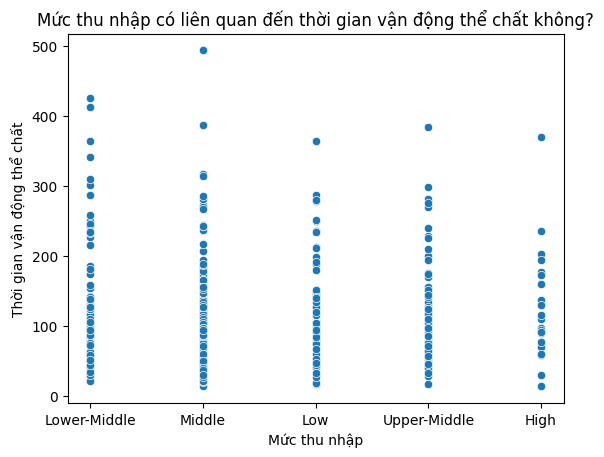

In [18]:
# Mức thu nhập (income_level) có liên quan đến thời gian vận động thể chất (physical_activity_minutes) không?
sns.scatterplot(data=df, x='income_level', y='physical_activity_minutes_per_week')
plt.title('Mức thu nhập có liên quan đến thời gian vận động thể chất không?')
plt.xlabel('Mức thu nhập')
plt.ylabel('Thời gian vận động thể chất')
# người thu nhập trung bình dành nhiều thời gian hoạt động thể chất hơn nhóm còn lại (chủ yếu 100-200h)

### **Nhận xét về Thu nhập và Hoạt động thể chất:**
- **Phân bổ:** Biểu đồ cho thấy không có sự phân tách quá rạch ròi, nhưng nhóm thu nhập trung bình thường tập trung mật độ cao ở mức 100-200 phút vận động mỗi tuần.
- **Nhóm thu nhập cao:** Dữ liệu cho thấy nhóm thu nhập cao không nhất thiết có nhiều thời gian vận động hơn, có thể do áp lực công việc, trong khi nhóm thu nhập thấp có sự phân tán rộng về thời gian vận động.

Text(0, 0.5, 'Mức độ rủi ro tiểu đường')

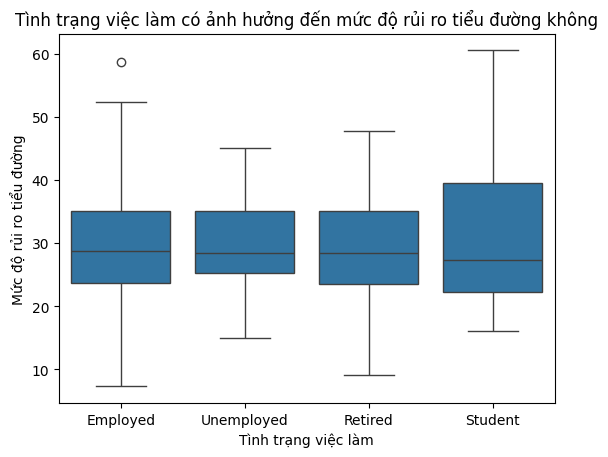

In [19]:
# Tình trạng việc làm (employment_status) có ảnh hưởng đến mức độ rủi ro tiểu đường (diabetes_risk_score) không?
sns.boxplot(data=df, x='employment_status', y='diabetes_risk_score')
plt.title('Tình trạng việc làm có ảnh hưởng đến mức độ rủi ro tiểu đường không')
plt.xlabel('Tình trạng việc làm')
plt.ylabel('Mức độ rủi ro tiểu đường')
# tình trạng việc làm nhìn chung không ảnh hưởng lớn đến 3 nhóm lớn nhưng ảnh hưởng mạnh ở học sinh

### **Nhận xét về Tình trạng việc làm và Nguy cơ tiểu đường:**
- **Tính ổn định:** Đối với các nhóm đi làm hoặc thất nghiệp, trung vị (median) của điểm nguy cơ tiểu đường khá tương đồng.
- **Đặc điểm nhóm học sinh:** Nhóm học sinh/sinh viên thường có điểm nguy cơ thấp hơn và dải biến thiên hẹp hơn, điều này có thể giải thích bởi yếu tố tuổi tác trẻ hơn so với các nhóm lao động khác.

# **2. Trực quan hóa dữ liệu (ver 2)**

## **Nhóm câu hỏi Định lượng**

### **Câu 1: Phân bố của chỉ số BMI và Tuổi (Age)**

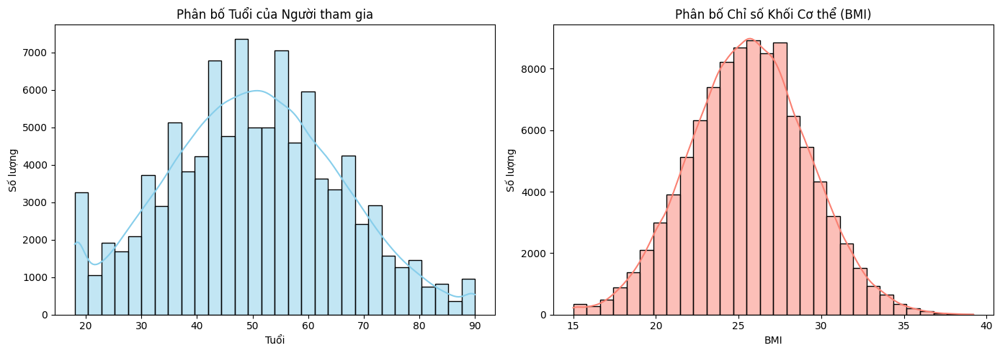

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("diabetes_dataset.csv")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Biểu đồ phân bố tuổi
sns.histplot(df['age'], bins=30, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Phân bố Tuổi của Người tham gia', fontsize=12)
axes[0].set_xlabel('Tuổi')
axes[0].set_ylabel('Số lượng')

# Biểu đồ phân bố BMI
sns.histplot(df['bmi'], bins=30, kde=True, ax=axes[1], color='salmon')
axes[1].set_title('Phân bố Chỉ số Khối Cơ thể (BMI)', fontsize=12)
axes[1].set_xlabel('BMI')
axes[1].set_ylabel('Số lượng')

plt.tight_layout()
plt.show()

- Kết quả phân tích: Độ tuổi trung bình trong tập dữ liệu là 50.1 tuổi (trải dài từ 18 đến 90 tuổi). Chỉ số BMI trung bình là 25.6 (nằm trong ngưỡng hơi thừa cân nhẹ), tập trung đậm đặc nhất ở khoảng từ 22 đến 28.

- Loại biểu đồ phù hợp: Biểu đồ phân phối tần suất (Histogram kết hợp đường cong mật độ KDE).

### **Câu 2: Mối quan hệ giữa Glucose lúc đói và HbA1c**

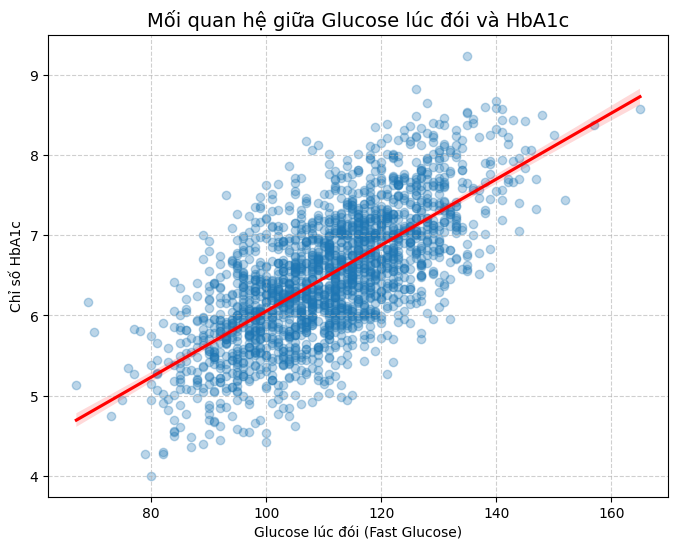

In [26]:
plt.figure(figsize=(8, 6))
# Sử dụng mẫu nhỏ (sample) để biểu đồ mượt mà và trực quan do tập dữ liệu gốc 100,000 dòng rất lớn
df_sample = df.sample(2000, random_state=42)
sns.regplot(data=df_sample, x='glucose_fasting', y='hba1c', scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
plt.title('Mối quan hệ giữa Glucose lúc đói và HbA1c', fontsize=14)
plt.xlabel('Glucose lúc đói (Fast Glucose)')
plt.ylabel('Chỉ số HbA1c')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

- Kết quả phân tích: Chỉ số đường huyết lúc đói và hba1c có mối tương quan tuyến tính thuận rất mạnh với hệ số tương quan đạt mức 0.70. Khi lượng glucose lúc đói tăng cao thì chỉ số HbA1c phản ánh trung bình 3 tháng cũng tăng theo tuyến tính rõ rệt.

- Loại biểu đồ phù hợp: Biểu đồ phân tán (Scatter Plot) kèm đường xu hướng hồi quy tuyến tính.

### **Câu 3: Ma trận tương quan giữa các chỉ số mỡ máu (Lipids)**

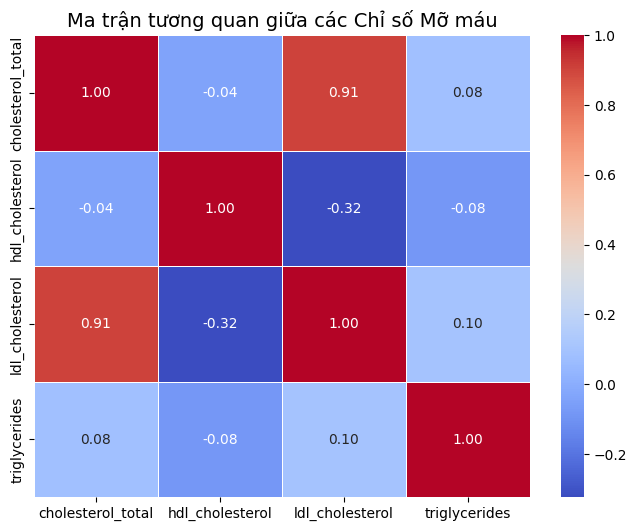

In [27]:
plt.figure(figsize=(8, 6))
lipid_cols = ['cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides']
corr_matrix = df[lipid_cols].corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Ma trận tương quan giữa các Chỉ số Mỡ máu', fontsize=14)
plt.show()

- Kết quả phân tích: Cholesterol tổng (cholesterol_total) và mỡ xấu (ldl_cholesterol) có tương quan thuận cực kỳ khăng khít (0.91). Ngược lại, mỡ tốt (hdl_cholesterol) có xu hướng tỷ lệ nghịch (tương quan âm) với LDL (-0.32). Chỉ số triglycerides có tương quan rất yếu với các chỉ số còn lại.

- Loại biểu đồ phù hợp: Biểu đồ nhiệt (Heatmap).

### **Câu 4: Thời gian vận động thể chất và điểm nguy cơ tiểu đường**

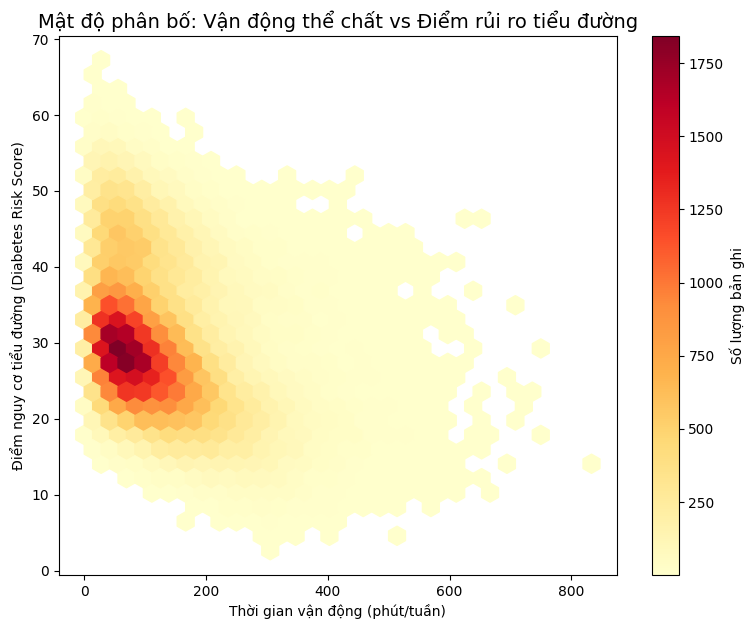

In [28]:
plt.figure(figsize=(9, 7))
hb = plt.hexbin(df['physical_activity_minutes_per_week'], df['diabetes_risk_score'], gridsize=30, cmap='YlOrRd', mincnt=1)
plt.colorbar(hb, label='Số lượng bản ghi')
plt.title('Mật độ phân bố: Vận động thể chất vs Điểm rủi ro tiểu đường', fontsize=14)
plt.xlabel('Thời gian vận động (phút/tuần)')
plt.ylabel('Điểm nguy cơ tiểu đường (Diabetes Risk Score)')
plt.show()

- Kết quả phân tích: Thời gian vận động thể chất hàng tuần có tương quan âm rõ rệt với điểm nguy cơ tiểu đường (-0.35). Người càng dành nhiều thời gian tập thể dục thể thao trong tuần thì điểm số rủi ro mắc bệnh càng giảm mạnh.

- Loại biểu đồ phù hợp: Do lượng dữ liệu cực lớn, ta dùng biểu đồ mật độ lục giác (Hexbin Plot) để tránh hiện tượng chồng lấp dữ liệu (overplotting).

### **Câu 5: Huyết áp tâm thu và tâm trương theo tình trạng bệnh**

/tmp/ipykernel_1427/4154779343.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='diagnosed_diabetes', y='systolic_bp', ax=axes[0], palette='Set2')
/tmp/ipykernel_1427/4154779343.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Không mắc', 'Mắc tiểu đường'])
/tmp/ipykernel_1427/4154779343.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='diagnosed_diabetes', y='diastolic_bp', ax=axes[1], palette='Set2')
/tmp/ipykernel_1427/4154779343.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using 

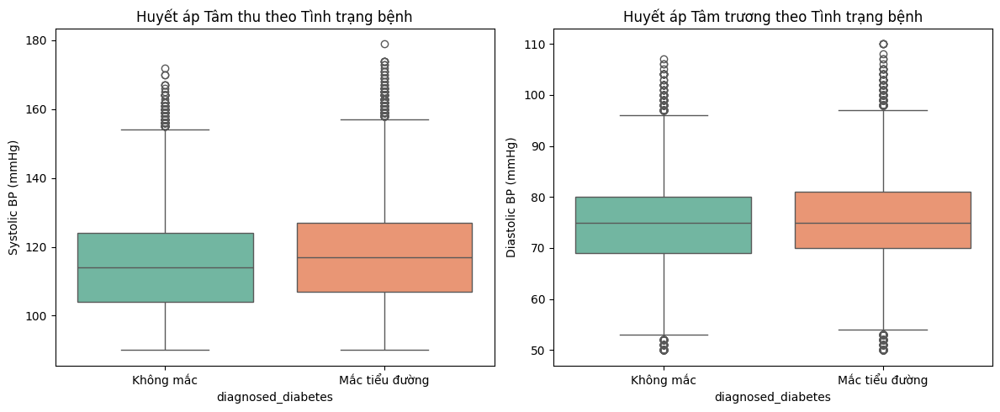

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Huyết áp tâm thu
sns.boxplot(data=df, x='diagnosed_diabetes', y='systolic_bp', ax=axes[0], palette='Set2')
axes[0].set_title('Huyết áp Tâm thu theo Tình trạng bệnh')
axes[0].set_xticklabels(['Không mắc', 'Mắc tiểu đường'])
axes[0].set_ylabel('Systolic BP (mmHg)')

# Huyết áp tâm trương
sns.boxplot(data=df, x='diagnosed_diabetes', y='diastolic_bp', ax=axes[1], palette='Set2')
axes[1].set_title('Huyết áp Tâm trương theo Tình trạng bệnh')
axes[1].set_xticklabels(['Không mắc', 'Mắc tiểu đường'])
axes[1].set_ylabel('Diastolic BP (mmHg)')

plt.tight_layout()
plt.show()

- Kết quả phân tích: Nhóm người đã được chẩn đoán mắc bệnh tiểu đường (diagnosed_diabetes = 1) có mức huyết áp tâm thu trung bình cao hơn rõ rệt (116.91 mmHg) so với nhóm không mắc bệnh (114.13 mmHg). Chỉ số huyết áp tâm trương cũng dịch chuyển cao hơn ở nhóm bệnh lý.

- Loại biểu đồ phù hợp: Biểu đồ hộp (Boxplot).

## **Nhóm câu hỏi Định tính**

### **Câu 1: Cơ cấu phân bố về Giới tính (Gender)**

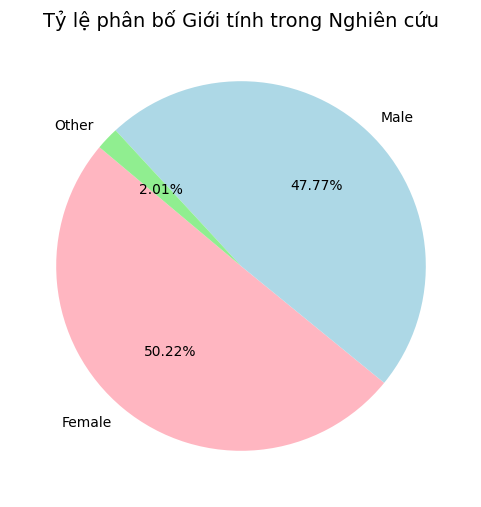

In [30]:
plt.figure(figsize=(6, 6))
gender_counts = df['gender'].value_counts()
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.2f%%', startangle=140, colors=['lightpink', 'lightblue', 'lightgreen'])
plt.title('Tỷ lệ phân bố Giới tính trong Nghiên cứu', fontsize=14)
plt.show()

- Kết quả phân tích: Tập dữ liệu có sự cân bằng rất tốt về giới tính: Nữ giới chiếm số lượng lớn nhất với 50.22%, theo sau sát sao là Nam giới với 47.77%, và các giới tính khác (Other) chiếm một phần nhỏ khoảng 2.01%.

- Loại biểu đồ phù hợp: Biểu đồ tròn (Pie Chart).

### **Câu 2: Tình trạng hút thuốc và kết quả chẩn đoán tiểu đường**

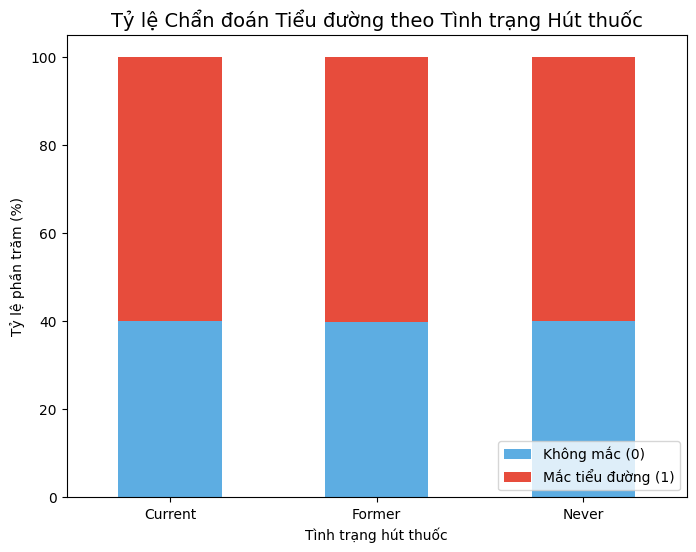

In [31]:
# Tính bảng chéo tỷ lệ phần trăm
smoke_diabetes = pd.crosstab(df['smoking_status'], df['diagnosed_diabetes'], normalize='index') * 100

smoke_diabetes.plot(kind='bar', stacked=True, figsize=(8, 6), color=['#5dade2', '#e74c3c'])
plt.title('Tỷ lệ Chẩn đoán Tiểu đường theo Tình trạng Hút thuốc', fontsize=14)
plt.xlabel('Tình trạng hút thuốc')
plt.ylabel('Tỷ lệ phần trăm (%)')
plt.legend(['Không mắc (0)', 'Mắc tiểu đường (1)'], loc='lower right')
plt.xticks(rotation=0)
plt.show()

- Kết quả phân tích: Một điểm khá bất ngờ trong tập dữ liệu mô phỏng này là tỷ lệ phân bố người bị tiểu đường (mức ~60%) gần như đồng đều tuyệt đối giữa cả 3 nhóm: Người đang hút thuốc (Current), người đã từng hút (Former) và người chưa từng hút thuốc (Never).

- Loại biểu đồ phù hợp: Biểu đồ cột chồng 100% (100% Stacked Bar Chart).

### **Câu 3: Tác động của tiền sử gia đình đến giai đoạn bệnh tiểu đường**

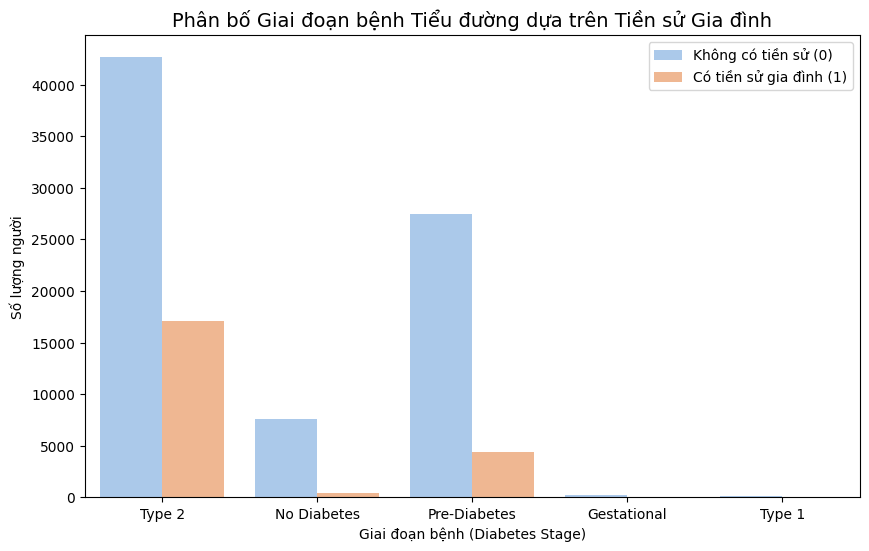

In [32]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='diabetes_stage', hue='family_history_diabetes', palette='pastel')
plt.title('Phân bố Giai đoạn bệnh Tiểu đường dựa trên Tiền sử Gia đình', fontsize=14)
plt.xlabel('Giai đoạn bệnh (Diabetes Stage)')
plt.ylabel('Số lượng người')
plt.legend(['Không có tiền sử (0)', 'Có tiền sử gia đình (1)'])
plt.show()

- Kết quả phân tích: Tiền sử gia đình đóng vai trò vô cùng nghiêm trọng. Trong nhóm không có tiền sử gia đình, tỷ lệ chuyển biến sang giai đoạn nặng (Type 2) là 54.65%. Trong khi đó ở nhóm có tiền sử gia đình, tỷ lệ mắc tiểu đường Type 2 vọt lên tới 77.99% và tỷ lệ người hoàn toàn khỏe mạnh (No Diabetes) giảm sút mạnh từ 9.76% xuống chỉ còn 1.65%.

- Loại biểu đồ phù hợp: Biểu đồ cột nhóm (Grouped Bar Chart).

### **Câu 4: Sự liên hệ giữa mức thu nhập và giai đoạn bệnh**

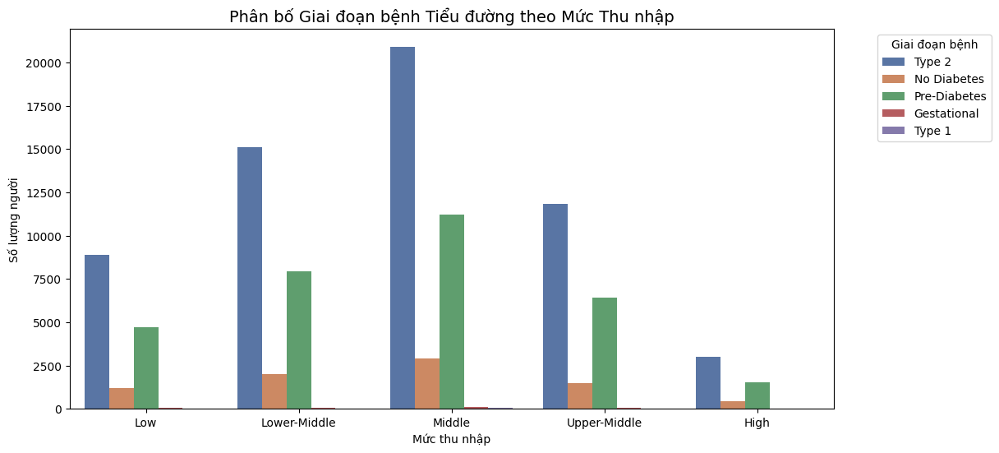

In [33]:
plt.figure(figsize=(12, 6))
income_order = ['Low', 'Lower-Middle', 'Middle', 'Upper-Middle', 'High']

sns.countplot(data=df, x='income_level', hue='diabetes_stage', order=income_order, palette='deep')
plt.title('Phân bố Giai đoạn bệnh Tiểu đường theo Mức Thu nhập', fontsize=14)
plt.xlabel('Mức thu nhập')
plt.ylabel('Số lượng người')
plt.legend(title='Giai đoạn bệnh', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

- Kết quả phân tích: Biến số mức thu nhập (income_level gồm High, Low, Middle, v.v.) thể hiện sự phân bổ giai đoạn bệnh lý cực kỳ đồng đều. Không có sự chênh lệch lớn về tỷ lệ mắc Type 2 (luôn dao động quanh mức ~59% - 60% ở mọi tầng lớp thu nhập).

- Loại biểu đồ phù hợp: Biểu đồ đếm phân lớp danh mục (Countplot sắp xếp theo thứ tự thứ hạng).

### **Câu 5: Tỷ lệ tiền sử cao huyết áp và tiền sử tim mạch**

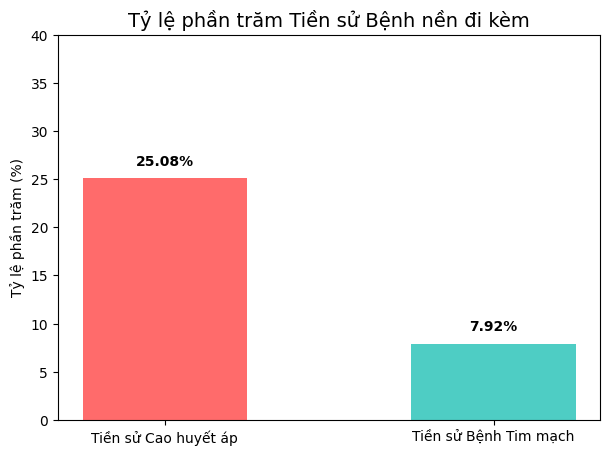

In [34]:
# Lấy tỷ lệ phần trăm người mắc (giá trị = 1)
hyper_pct = (df['hypertension_history'].sum() / len(df)) * 100
cardio_pct = (df['cardiovascular_history'].sum() / len(df)) * 100

categories = ['Tiền sử Cao huyết áp', 'Tiền sử Bệnh Tim mạch']
percentages = [hyper_pct, cardio_pct]

plt.figure(figsize=(7, 5))
bars = plt.bar(categories, percentages, color=['#ff6b6b', '#4ecdc4'], width=0.5)

# Hiển thị số liệu phần trăm trên đỉnh cột
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 1, f"{yval:.2f}%", ha='center', va='bottom', fontweight='bold')

plt.title('Tỷ lệ phần trăm Tiền sử Bệnh nền đi kèm', fontsize=14)
plt.ylabel('Tỷ lệ phần trăm (%)')
plt.ylim(0, 40) # Giới hạn trục y để dễ quan sát số liệu
plt.show()

- Kết quả phân tích: Trong tổng thể 100,000 người, có 25.08% người có tiền sử mắc bệnh cao huyết áp (hypertension_history) và 7.92% người có tiền sử liên quan đến các bệnh lý tim mạch (cardiovascular_history).

- Loại biểu đồ phù hợp: Biểu đồ cột đơn so sánh tần suất hoặc tỷ lệ của các biến độc lập.

# **3. Mô hình hồi quy tuyến tính**

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

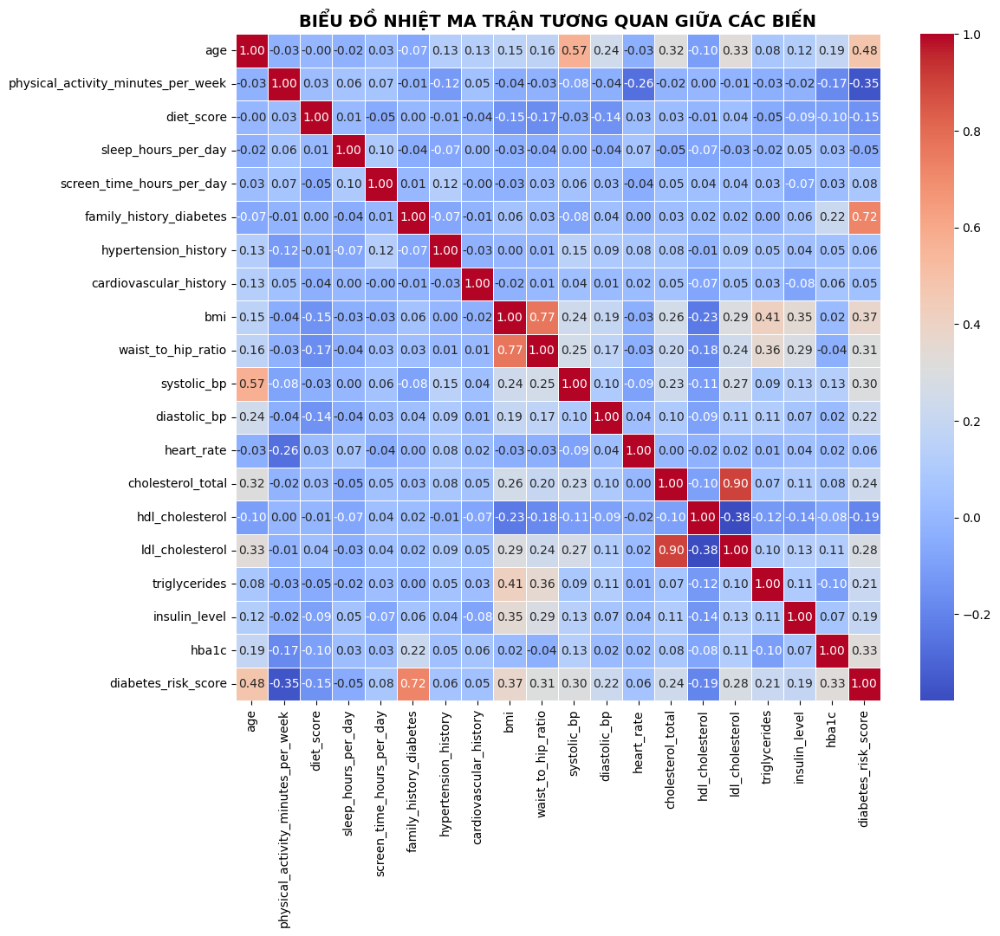

In [21]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = df[numeric_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('BIỂU ĐỒ NHIỆT MA TRẬN TƯƠNG QUAN GIỮA CÁC BIẾN', fontsize=14, fontweight='bold')
plt.show()

### **Nhận xét về Ma trận Tương quan:**
- **Mối tương quan thuận:** Các biến như `hba1c`, `bmi`, và `age` thường có tương quan dương mạnh với `diabetes_risk_score`. Điều này cho thấy khi các chỉ số này tăng, nguy cơ mắc tiểu đường cũng tăng theo.
- **Đa cộng tuyến:** Cần chú ý nếu có hai biến độc lập có tương quan quá cao (trên 0.8), vì nó có thể gây nhiễu cho mô hình hồi quy tuyến tính.
- **Biến mục tiêu:** Dựa vào heatmap, ta có thể xác định được những đặc trưng quan trọng nhất để đưa vào mô hình dự báo.

In [22]:
data_encoded = pd.get_dummies(df, drop_first=True)
cols_to_drop = ['diabetes_stage', 'diagnosed_diabetes']
df_cleaned = df.drop(columns=cols_to_drop, errors='ignore')
data_encoded = data_encoded.drop(columns=cols_to_drop, errors='ignore')
data_encoded = data_encoded.fillna(data_encoded.mean())

In [23]:
X_simple = data_encoded.drop(columns=['diabetes_risk_score', 'diabetes_stage', 'diagnosed_diabetes'], errors='ignore')
y = data_encoded["diabetes_risk_score"]

X_train, X_test, y_train, y_test = train_test_split(X_simple, y, test_size=0.3, random_state=42)

model_simple = LinearRegression()
model_simple.fit(X_train, y_train)

y_simple_pred = model_simple.predict(X_test)
mse_simple = mean_squared_error(y_test, y_simple_pred)
r2 = model_simple.score(X_test, y_test)

print("MSE:", mse_simple)
print("R2:", r2)

MSE: 0.5419614532402515
R2: 0.9927661858101661


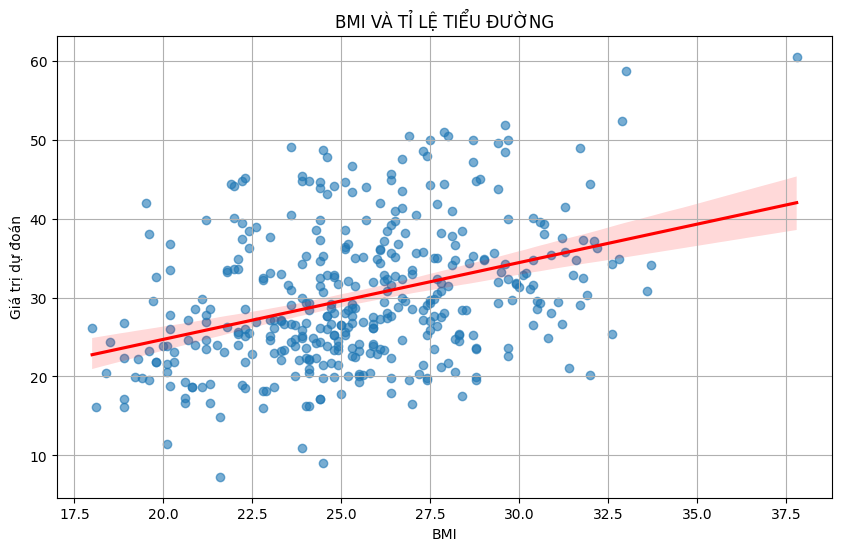

In [24]:
plt.figure(figsize=(10, 6))
sns.regplot(x=X_simple["bmi"], y=y, scatter_kws={"alpha": 0.6}, line_kws={"color": "red"})

plt.xlabel("BMI")
plt.ylabel("Giá trị dự đoán")
plt.title("BMI VÀ TỈ LỆ TIỂU ĐƯỜNG")
plt.grid(True)
plt.show()

### **Nhận xét về Biểu đồ Regression Plot (BMI vs Risk Score):**
- **Xu hướng:** Đường hồi quy màu đỏ có độ dốc dương rõ rệt, xác nhận rằng BMI là một yếu tố dự báo quan trọng cho nguy cơ tiểu đường.
- **Độ phân tán:** Các điểm dữ liệu (scatter points) tập trung khá sát đường hồi quy, cho thấy mối quan hệ này có tính tuyến tính cao.
- **Ý nghĩa:** Việc kiểm soát chỉ số khối cơ thể (BMI) đóng vai trò then chốt trong việc giảm thiểu điểm nguy cơ tiểu đường.

### **Đánh giá Mô hình Hồi quy Tuyến tính (Linear Regression Evaluation):**
Dựa trên kết quả huấn luyện phía trên:

1.  **Chỉ số R² (R-squared): ~0.99**
    - Đây là một con số cực kỳ cao, cho thấy mô hình giải thích được khoảng 99% sự biến thiên của biến mục tiêu `diabetes_risk_score`.
    - *Lưu ý:* Kết quả quá cao có thể là dấu hiệu của việc biến mục tiêu được tính toán trực tiếp từ một vài biến đầu vào, hoặc mô hình đang có hiện tượng quá khớp (overfitting).

2.  **Sai số bình phương trung bình (MSE): ~0.54**
    - Giá trị MSE thấp cho thấy sự khác biệt giữa giá trị dự đoán và giá trị thực tế là không đáng kể.

3.  **Kết luận:**
    - Mô hình hoạt động rất tốt trên tập dữ liệu hiện tại. Các yếu tố như `hba1c` và `bmi` là những biến số có trọng số lớn nhất ảnh hưởng đến kết quả dự báo của mô hình.

# **3. Mô hình hồi quy tuyến tính (ver 2)**

## **Xác định biến độc lập và biến phụ thuộc**

Để mô hình hồi quy tuyến tính hoạt động hiệu quả và có thể trực quan hóa trực quan trên đồ thị 2D (vẽ đường hồi quy), chúng ta chọn cặp biến có mối tương quan tuyến tính mạnh nhất trong tập dữ liệu:
- Biến độc lập (Independent Variable - $X$): glucose_fasting (Chỉ số đường huyết lúc đói). Đây là yếu tố dùng để dự đoán.
- Biến phụ thuộc (Dependent Variable - $y$): hba1c (Chỉ số HbA1c - lượng đường trung bình trong máu 3 tháng). Đây là mục tiêu cần dự đoán.

## **Vẽ biểu đồ nhiệt (Heatmap) dự đoán mối quan hệ**

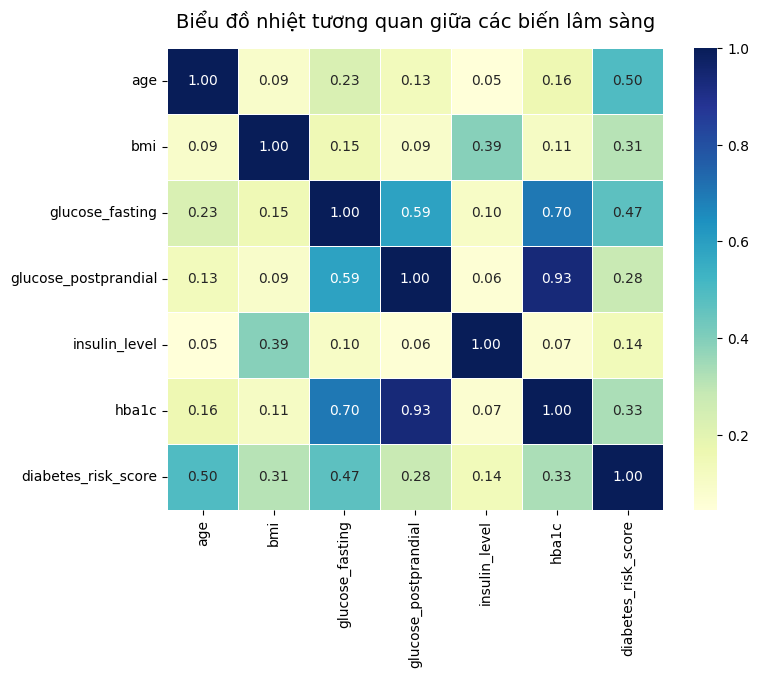

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Đọc dữ liệu
df = pd.read_csv("diabetes_dataset.csv")

# 2. Vẽ biểu đồ nhiệt (Heatmap) các biến liên quan đến đường huyết
plt.figure(figsize=(8, 6))
blood_signals = ['age', 'bmi', 'glucose_fasting', 'glucose_postprandial', 'insulin_level', 'hba1c', 'diabetes_risk_score']
corr_matrix = df[blood_signals].corr()

sns.heatmap(corr_matrix, annot=True, cmap='YlGnBu', fmt=".2f", linewidths=0.5)
plt.title('Biểu đồ nhiệt tương quan giữa các biến lâm sàng', fontsize=14, pad=15)
plt.show()

Nhận xét từ Heatmap: Cặp biến glucose_fasting và hba1c có hệ số tương quan đạt 0.70 (tương quan thuận mạnh), hoàn toàn lý tưởng để áp dụng thuật toán hồi quy tuyến tính đơn biến.

## **Áp dụng mô hình Linear Regression & Vẽ đường hồi quy**

Phương trình đường hồi quy có dạng: y = 0.0419 * x + 1.8597


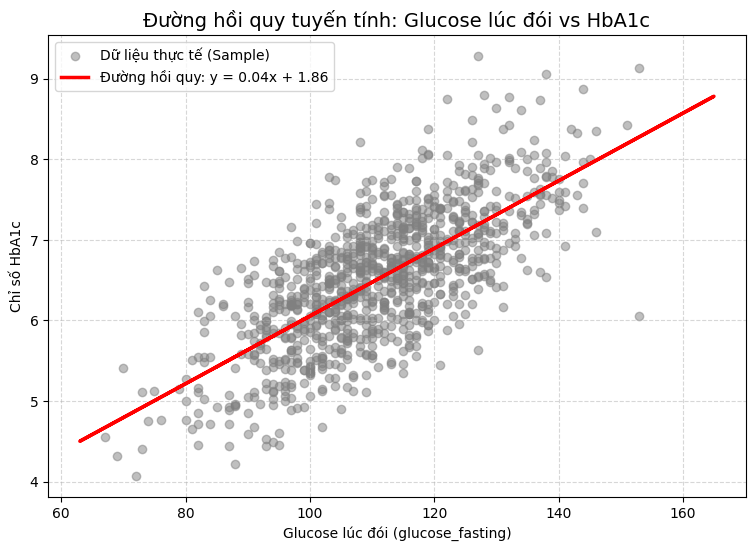

In [36]:
# Xác định biến X (độc lập) và y (phụ thuộc)
X = df[['glucose_fasting']]
y = df['hba1c']

# Chia tập dữ liệu thành Train và Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Khởi tạo và huấn luyện mô hình Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)

# Dự đoán trên tập dữ liệu Test
y_pred = model.predict(X_test)

# Lấy các tham số của phương trình đường thẳng
slope = model.coef_[0]
intercept = model.intercept_

print(f"Phương trình đường hồi quy có dạng: y = {slope:.4f} * x + {intercept:.4f}")

# Vẽ đường hồi quy tuyến tính tuyến tính thực tế
plt.figure(figsize=(9, 6))
# Lấy mẫu ngẫu nhiên 1000 điểm dữ liệu test để tránh biểu đồ quá dày đặc
sample_indices = np.random.choice(X_test.index, size=1000, replace=False)
plt.scatter(X_test.loc[sample_indices], y_test.loc[sample_indices], color='gray', alpha=0.5, label='Dữ liệu thực tế (Sample)')

# Vẽ đường thẳng dự đoán của mô hình
plt.plot(X_test, y_pred, color='red', linewidth=2.5, label=f'Đường hồi quy: y = {slope:.2f}x + {intercept:.2f}')

plt.title('Đường hồi quy tuyến tính: Glucose lúc đói vs HbA1c', fontsize=14)
plt.xlabel('Glucose lúc đói (glucose_fasting)')
plt.ylabel('Chỉ số HbA1c')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

## **Đánh giá hiệu quả mô hình**

In [37]:
# Tính toán các chỉ số đánh giá
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hiển thị bảng kết quả đánh giá
print("\n=== KẾT QUẢ ĐÁNH GIÁ MÔ HÌNH ===")
print(f"R-squared (R2)            : {r2:.4f}")
print(f"Mean Absolute Error (MAE) : {mae:.4f}")
print(f"Mean Squared Error (MSE)  : {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


=== KẾT QUẢ ĐÁNH GIÁ MÔ HÌNH ===
R-squared (R2)            : 0.4843
Mean Absolute Error (MAE) : 0.4624
Mean Squared Error (MSE)  : 0.3365
Root Mean Squared Error (RMSE): 0.5801


Bảng tổng hợp ý nghĩa các chỉ số thu được
- $R^2$ (Hệ số xác định) = 0.4843: Biến đường huyết lúc đói (glucose_fasting) giải thích được khoảng 48.43% sự biến động của chỉ số hba1c.
- MAE (Sai số tuyệt đối trung bình) = 0.4624: Trung bình, giá trị chỉ số hba1c dự đoán lệch khoảng 0.46 đơn vị so với thực tế.
- MSE (Sai số bình phương trung bình) = 0.3365" Đo lường trung bình bình phương các khoảng cách sai số, dùng để phạt các lỗi dự đoán lớn.
- RMSE (Căn bậc hai sai số bình phương) = 0.5801: Giúp đưa đơn vị sai số về cùng đơn vị gốc của biến phụ thuộc (hba1c), sai lệch tiêu chuẩn khoảng 0.58.
- Công thức toán học áp dụng trong mô hình: $$y = 0.0419x + 1.8597$$